# Unsupervised Clustering

While the excellent results with the supervised methods
demonstrate the usefulness of machine learning
it requires prior knowledge of the structures of interest.
An alternate take on the machine learning is to use unsupervised learning,
which takes a collection of data and finds collections of similar data points.

## Environment Setup

This imports the functions required for the notebook,
making the notebook interactions simple.

In [1]:
import numpy as np
import pandas as pd
import altair as alt
from sklearn import cluster, decomposition, preprocessing
from sdanalysis.order import (
    compute_neighbours,
    relative_orientations,
    relative_distances,
)
import umap

import warnings

warnings.filterwarnings("ignore")

# Import project tools
import sys

sys.path.append("../src")
import trimer
import figures

figures.use_my_theme()

# Configure Bokeh to output the figures to the notebook
from bokeh.io import output_notebook, show, export_svgs

output_notebook()

Loading BokehJS ...

With the utility functions loaded into the environment,
this reads the files of interest,
being the p2, p2gg, and pg crystals,
as a list of frames into the snaps variable.

In [43]:
crystals = ["p2", "p2gg", "pg"]
snaps = []
for c in crystals:
    snaps.append(trimer.read_file(index=1, pressure=1.0, temperature=0.40, crystal=c,))
    
classes = np.concatenate(
    [trimer.classify_mols(snap, v) for snap, v in zip(snaps, crystals)]
)
y_mask = classes < 4
y = pd.Categorical.from_codes(classes[y_mask], categories=["Liquid", "p2", "p2gg", "pg"])

## Orientational Clustering

From the [analysis of the features](02_Features.ipynb)
the relative orientations account for
a large proportion of the difference between crystal structures.
So a simple initial approach is to use the relative orientations
as the feature space.
For this initial analysis I am using the relative orientation
of each of the six nearest neighbours.
The relative orientations are calculated below
and stored in the variable `X` for classification.

In [3]:
orientations = np.concatenate(
    [
        relative_orientations(
            s.box, s.position, s.orientation, max_neighbours=6, max_radius=3.8
        )
        for s in snaps
    ]
)
X = orientations
X_reduced = umap.UMAP(random_state=42).fit_transform(X)

For the actual clustering
there are a number of different clustering algorithms
which each have their own strengths and weaknesses.
Here we are mostly interested in the clustering algorithms
that work well for out dataset.
The scikit-learn [documentation](http://scikit-learn.org/stable/modules/clustering.html)
has an excellent overview of each of the different clustering algorithms,
which you should look at for more information.

The first algorithm we are going to use is the K-Means,
primarily because the K-Nearest Neighbours worked so well
for the supervised classification.
The K-Means clustering requires that the number of clusters
is specified beforehand.
Using three clusters gives the best separation of the
liquid and crystal states,
which can be seen in the images below.
When increasing to four clusters,
there is only further separation of the liquid state,
the p2 and p2gg crystals remain in the same cluster.
The clustering of the points results in lots of noise within the liquid phase,
many of the particles being classified as one of the crystal structures.


In [4]:
categories = cluster.KMeans(n_clusters=4).fit_predict(X)
fig = figures.plot_configuration_grid(snaps, categories,)

show(fig)

In [5]:
factors = np.unique(categories).astype(str)
for s, c, f in zip(snaps, crystals, np.split(categories, len(crystals))):
    fig = figures.plot_frame(s, order_list=f, categorical_colour=True, factors=factors)
    fig = figures.style_snapshot(fig)

In [6]:
fig = figures.plot_dimensionality_reduction(X_reduced, categories)

One of the concerns with the K-Means clustering
is the specification of the number of clusters which are present.
Part of the reason for unsupervised classification
is the removal of prior knowledge about the system,
which would include the number of clusters expected.
An alternate algorithm is DBSCAN,
in which clusters are regions of high density
surrounded by regions of low density.
In using regions of high density as the center of clusters,
with a requirement for a minimum number of samples `min_samples`,
the resulting number of clusters is a property of the algorithm.

It can be seen in the images below that the DBSCAN algorithm
does an excellent job of separating the liquid and crystals,
with very little noise.
Additionally it appears to have identified defect structures
within the p2 and p2gg crystal structures,
which is completely new information.

In [7]:
categories = cluster.DBSCAN(min_samples=50, eps=0.6).fit_predict(X)
fig = figures.plot_configuration_grid(snaps, categories,)
show(fig)

In [8]:
factors = np.unique(categories).astype(str)
for s, c, f in zip(snaps, crystals, np.split(categories, len(crystals))):
    fig = figures.plot_frame(s, order_list=f, categorical_colour=True, factors=factors)
    fig = figures.style_snapshot(fig)

In [9]:
fig = figures.plot_dimensionality_reduction(X_reduced, categories)

In [10]:
categories = cluster.OPTICS(min_samples=100).fit_predict(X)
fig = figures.plot_configuration_grid(snaps, categories, remove_styling=True,)
show(fig)

In [11]:
factors = np.unique(categories).astype(str)
for s, c, f in zip(snaps, crystals, np.split(categories, len(crystals))):
    fig = figures.plot_frame(s, order_list=f, categorical_colour=True, factors=factors)
    fig = figures.style_snapshot(fig)

In [12]:
fig = figures.plot_dimensionality_reduction(X_reduced, categories)

## Adding additional Dimensions

While we have some excellent results using the DBSCAN algorithm,
we are still unable to distinguish the p2 from the p2gg crystal
in the clustering analysis.
While they are very similar crystal structures,
this is more a look at how additional pieces of information
can help or hinder these results.

### Relative Distance to Neighbours

The relative distance to the nearest neighbours
was one of the additional dimensions investigated in
the [feature detection notebook](02_Features.ipynb),
with it having very little effect on the classification.

In combining the already computed orientations
with the distances to each neighbour below
we can create a combined dataset.

In [13]:
distances = np.concatenate([relative_distances(s.box, s.position) for s in snaps])
distances[np.isnan(distances)] = 0
combined = np.concatenate((orientations, distances), axis=1)
X_c = combined
X_c_reduced = umap.UMAP().fit_transform(X_c)

The result of the additional dimensionality is nearly the same result
as with just the orientations as shown in the figure below.
This highlights that using the most appropriate data
for the specific problem is far more important than lots of data.

In [14]:
categories = cluster.DBSCAN(min_samples=50, eps=1.0).fit_predict(X_c)
fig = figures.plot_configuration_grid(snaps, categories,)
show(fig)

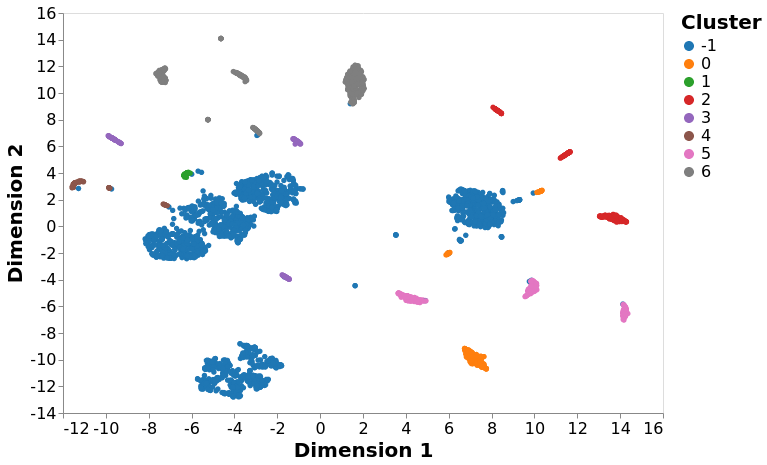

In [15]:
figures.plot_dimensionality_reduction(X_c_reduced, categories)

## Reducing Dimensionality

As we increase the number of dimensions
we also increase the amount of work for classification,
particularly for dealing with 3D systems with more neighbours
and more degrees of freedom.
The same techniques which were used for [feature detection](02_Features.ipynb)
can also be used as a pre-processing step for clustering analysis,
reducing a large number of dimensions down to the most important ones.

Here I am demonstrating how we can use
the non-linear Principal Components Analysis (PCA)
to transform all the data points of the rotations
into a basis set with the two most important dimensions.
The goal is to then use just these two dimensions
instead of six to perform the clustering.

In [16]:
pca = decomposition.KernelPCA(kernel="rbf", n_components=4)
X_t = pca.fit_transform(X)

The K-Means clustering is simple so we can use it to attempt to replicate
the results for all the dimensions.
This results in a very similar clustering.

In [17]:
fig = figures.plot_clustering(cluster.DBSCAN(min_samples=50, eps=0.9), X, snaps,)
show(fig)

The parameters of the DBSCAN algorithm have to be modified
to get a more optimal performance with the new dataset
since distances and densities have changed.
Though we are able replicate the liquid and crystal separation.
In the previous analysis with all the dimensions
the liquid was all blue,
the group of molecules which didn't have a high enough density to form a cluster.
In this transformed feature space
most of the liquid now lies within it's own cluster,
and interesting byproduct of this particular transformation of feature space.

In [18]:
fig = figures.plot_clustering(cluster.DBSCAN(eps=0.05, min_samples=50), X_t, snaps,)
show(fig)

In [19]:
categories = cluster.OPTICS(min_samples=100).fit_predict(X_reduced)
fig = figures.plot_configuration_grid(snaps, categories,)
show(fig)

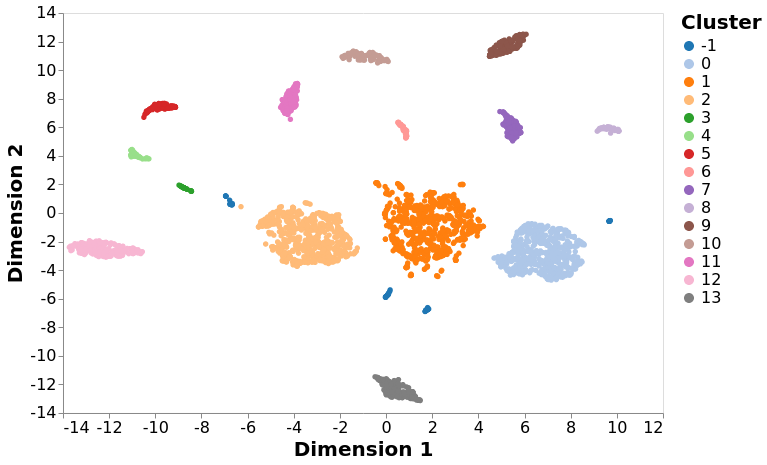

In [20]:
fig = figures.plot_dimensionality_reduction(X_reduced, categories)
fig

## Sorting the angles

In [21]:
X_s = np.sort(X, axis=1)
X_s_reduced = umap.UMAP(random_state=42).fit_transform(X_s)

In [22]:
categories = cluster.OPTICS(min_samples=150).fit_predict(X_s_reduced)
fig = figures.plot_configuration_grid(snaps, categories,)
show(fig)

In [23]:
factors = np.unique(categories).astype(str)
for s, c, f in zip(snaps, crystals, np.split(categories, len(crystals))):
    fig = figures.plot_frame(s, order_list=f, categorical_colour=True, factors=factors)
    fig = figures.style_snapshot(fig)

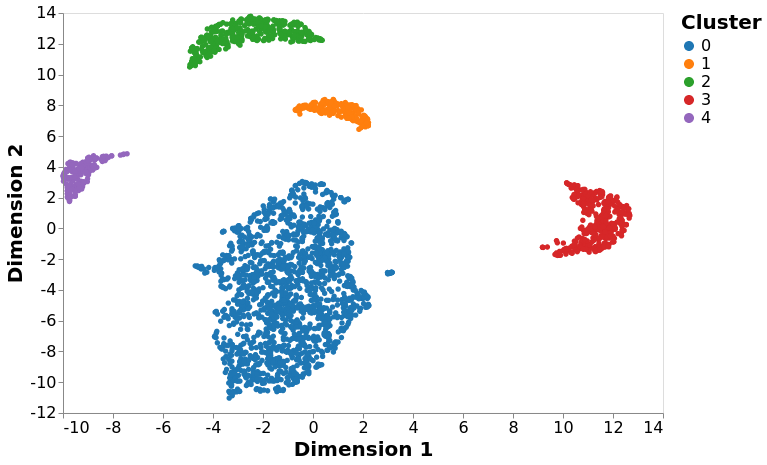

In [24]:
fig = figures.plot_dimensionality_reduction(X_s_reduced, categories)
fig

In [25]:
categories = cluster.OPTICS(min_samples=150).fit_predict(X_s_reduced)
fig = figures.plot_configuration_grid(snaps, categories,)
show(fig)

In [26]:
import hdbscan

In [27]:
categories = hdbscan.HDBSCAN(min_cluster_size=150).fit_predict(np.sort(X, axis=1))

In [28]:
fig = figures.plot_configuration_grid(snaps, categories,)
show(fig)

In [29]:
factors = np.unique(categories).astype(str)
for s, c, f in zip(snaps, crystals, np.split(categories, len(crystals))):
    fig = figures.plot_frame(s, order_list=f, categorical_colour=True, factors=factors)
    fig = figures.style_snapshot(fig)
    fig.output_backend = "svg"
    export_svgs(fig, f"../figures/cluster_sorted_hdbscan_{c}.svg")

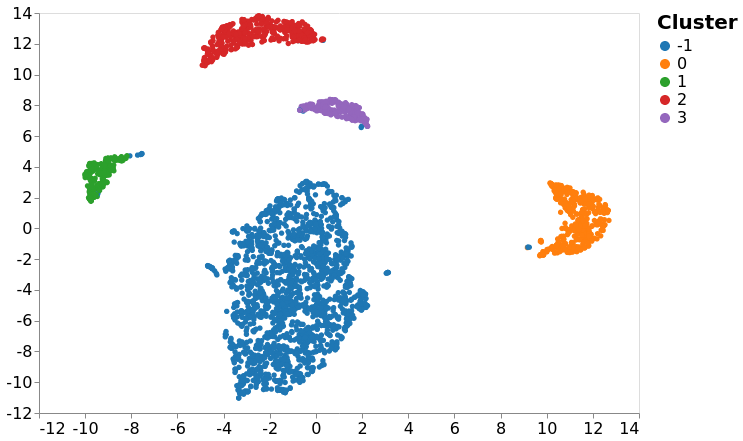

In [30]:
fig = figures.plot_dimensionality_reduction(X_s_reduced, categories, axis_labels=False)
with alt.data_transformers.enable("default"):
    fig.save("../figures/cluster_sorted_hdbscan_vis.svg", webdriver="firefox")
fig

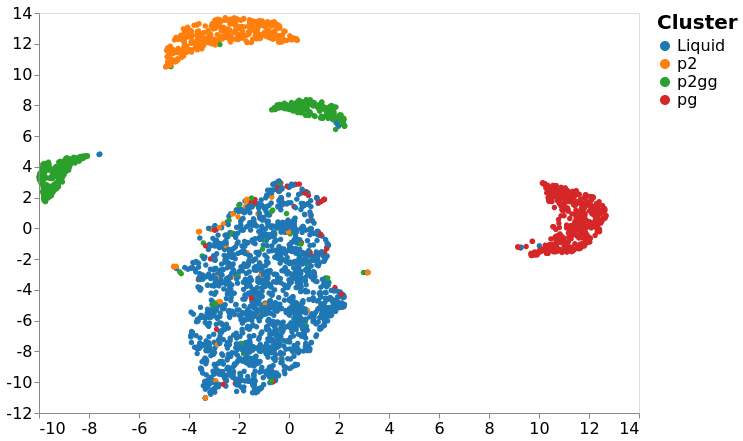

In [44]:
fig = figures.plot_dimensionality_reduction(X_s_reduced[y_mask], y, axis_labels=False)
with alt.data_transformers.enable("default"):
    fig.save("../figures/dim_reduction_sorted_UMAP.svg", webdriver="firefox")
fig